# **Data understanding**


## **Collect initial data**  

The dataset was collected from [Kaggle](https://www.kaggle.com/datasets/jayaantanaath/student-habits-vs-academic-performance/data), which contains synthetic student records. With 1,000 student entries and 16 features, this dataset offers a broad view of various factors such as study hours, sleep patterns, social media usage, diet quality, mental health, and final exam scores. The dataset simulates realistic student behaviors, making it ideal for machine learning projects, regression analysis, and clustering, and is particularly useful for exploratory data analysis (EDA) and data visualization. According to the provider’s description, this dataset is designed to explore the relationship between daily habits,such as Netflix watching, sleep, or social media activity,and academic success, offering insights into how these factors might influence GPA. By analyzing this data, we can begin to make informed decisions about early interventions and personalized support for students, focusing on those lifestyle patterns that might need adjustment for improved academic outcomes.

## **Describe data** 
 
An initial understanding of the dataset is obtained by examining its overall structure and observable characteristics. The dataset is assessed in terms of its size, format, data types, and basic statistical properties to evaluate its quality and suitability for further analysis.

In [3]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
import scipy.stats as stats
from typing import Optional
from scipy import stats
import plotly.io as pio

sd = pd.read_csv("data/student_habits_performance.csv")

In [4]:
# Gross properties
print(f"Number of records (rows): {sd.shape[0]}")
print(f"Number of fields (columns): {sd.shape[1]}")
print(f"Data format: CSV")
print(f"Column names: {list(sd.columns)}")
print("\n")

Number of records (rows): 1000
Number of fields (columns): 16
Data format: CSV
Column names: ['student_id', 'age', 'gender', 'study_hours_per_day', 'social_media_hours', 'netflix_hours', 'part_time_job', 'attendance_percentage', 'sleep_hours', 'diet_quality', 'exercise_frequency', 'parental_education_level', 'internet_quality', 'mental_health_rating', 'extracurricular_participation', 'exam_score']




In [5]:
# Surface properties
print("Data types:")
print(sd.dtypes)
print("\n")

print("Summary statistics")
print("Numerical features:")
print(sd.describe())
print("\n")

print("Categorical features:")
print(sd.drop(columns='student_id').describe(include=['object', 'bool']))
print("\n")

print("Unique categorical values per feature:")
for col in sd.drop(columns='student_id').select_dtypes(include=['object', 'bool']).columns:
    print(f"{col}: {sd[col].unique()}")
print("\n")

print("Missing values per column:")
print(sd.isnull().sum())

Data types:
student_id                        object
age                                int64
gender                            object
study_hours_per_day              float64
social_media_hours               float64
netflix_hours                    float64
part_time_job                     object
attendance_percentage            float64
sleep_hours                      float64
diet_quality                      object
exercise_frequency                 int64
parental_education_level          object
internet_quality                  object
mental_health_rating               int64
extracurricular_participation     object
exam_score                       float64
dtype: object


Summary statistics
Numerical features:
             age  study_hours_per_day  social_media_hours  netflix_hours  \
count  1000.0000           1000.00000         1000.000000    1000.000000   
mean     20.4980              3.55010            2.505500       1.819700   
std       2.3081              1.46889            

The dataset includes both numerical and categorical features related to student habits and academic performance. To deepen the analysis, I will highlight key insights, recommend areas for further investigation, and propose potential next steps for more in-depth data exploration.

### **Overview of the dataset**

**Structure and format:**  
- **Size:** 1,000 records (rows) and 16 fields (columns)  
- **Feature Categories:**  
  - **Identifiers and demographics:** `student_id`, `age`, `gender`  
  - **Academic metrics:** `study_hours_per_day`, `attendance_percentage`, `exam_score`  
  - **Digital consumption and distraction metrics:** `social_media_hours`, `netflix_hours`  
  - **Lifestyle and well-being:** `sleep_hours`, `diet_quality`, `exercise_frequency`, `mental_health_rating`
  - **Engagement activities:**  `part_time_job`, `extracurricular_participation`
  - **External influences:** `parental_education_level`, `internet_quality`

**Descriptive table:** 
| Feature                          | Data Type             | Description                                                           | Stats / Values                                                   |
|----------------------------------|------------------------|-----------------------------------------------------------------------|------------------------------------------------------------------|
| `student_id`                    | Categorical (Object)   | Unique identifier for each student                                    | 1,000 unique values                                              |
| `age`                           | Numeric (int64)        | Age of the student in years                                           | Mean: 20.5, Min: 17, Max: 24, Std: 2.31                          |
| `gender`                        | Categorical            | Gender identity                                                       | Female (481), Male, Other                                        |
| `study_hours_per_day`          | Numeric (float64)      | Average daily study hours                                             | Mean: 3.55, Min: 0, Max: 8.3, Std: 1.47                          |
| `social_media_hours`           | Numeric (float64)      | Daily time spent on social media platforms (in hours)                | Mean: 2.51, Min: 0, Max: 7.2, Std: 1.17                          |
| `netflix_hours`                | Numeric (float64)      | Daily Netflix or similar entertainment usage (hours)                 | Mean: 1.82, Min: 0, Max: 5.4, Std: 1.08                          |
| `part_time_job`                | Categorical            | Whether the student has a part-time job                               | No (785), Yes                                                    |
| `attendance_percentage`        | Numeric (float64)      | Class attendance rate as a percentage                                 | Mean: 84.13%, Min: 56%, Max: 100%, Std: 9.40                     |
| `sleep_hours`                  | Numeric (float64)      | Average sleep per day (in hours)                                      | Mean: 6.47, Min: 3.2, Max: 10, Std: 1.23                         |
| `diet_quality`                 | Categorical            | Self-reported quality of diet                                         | Fair (437), Good, Poor                                           |
| `exercise_frequency`           | Numeric (int64)        | Number of days per week the student exercises (physical activity)     | Mean: 3.04, Min: 0, Max: 6, Std: 2.03                            |
| `parental_education_level`     | Categorical            | Highest education level of parents                                    | High School (392), Master, Bachelor (**91 missing**)            |
| `internet_quality`             | Categorical            | Self-rated quality of internet connection                             | Good (447), Average, Poor                                        |
| `mental_health_rating`         | Numeric (int64)        | Self-assessed mental health (1–10 scale)                              | Mean: 5.44, Min: 1, Max: 10, Std: 2.85                           |
| `extracurricular_participation`| Categorical            | Whether the student is involved in extracurricular activities         | No (682), Yes                                                    |
| `exam_score`                   | Numeric (float64)      | Final exam score (**target variable**)                                | Mean: 69.6, Min: 18.4, Max: 100, Std: 16.89                      |


**Data quality:**  
- There are missing values in *parental_education_level* (91 missing entries, about 9.1% of the dataset), which may affect how parental background is used as a proxy for socio-educational support in subsequent analysis.
- A mix of numerical and categorical types allows for a range of analytic CRISP-DM techniques.

### **Key initial observations**

#### Insights on academic performance and study habits

- **Study hours vs. exam scores:**  With an average study duration of roughly 3.55 hours daily and an exam average near 70, it is plausible to hypothesize that higher study hours (or more consistent study habits) could be positively correlated with exam scores. 
  
- **Attendance as an engagement proxy:**  A relatively high mean attendance (84.13%) suggests that regular class presence could be a major predictor of academic performance. However, the range (56% to 100%) signals that some students could be at risk due to low attendance.

#### Digital media usage and distractions

Average social media usage (about 2.51 hours) and netflix viewing (around 1.82 hours) might indicate potential distractions. In a proactive analytics framework, increased time on digital platforms might serve as early indicators of disengagement, assuming that these could negatively impact study routines or mental well-being.

#### Health and lifestyle factors

- **Sleep and mental health:**  The average sleep hours are approximately 6.47, with a relatively wide range observed. Sleep, combined with the mid-level mental health ratings (mean around 5.44), could suggest that issues like digital fatigue or stress might influence students’ academic output. 
  
- **Diet and exercise:**  Though summarized categorically, diet_quality and exercise_frequency (mean close to 3.04 on a scale with a max of 6) provide clues about the students’ overall lifestyle. These can be part of a broader analysis that links physical well-being to academic performance.

#### Socio-educational background

The variable parental_education_level has a notable number of missing values but still provides some context regarding students’ at-home academic support environments. Moreover, internet_quality (with "Good" being the dominant response) might hint at the technological readiness of students, an aspect that could affect participation in online learning and digital assignments.

## **Explore data**

### **Query the data**

To better understand the academic, behavioral, and lifestyle patterns of students, we explored the dataset through targeted queries and visual analyses. Using **histograms**, we examined the distribution of categorical variables such as **gender**, **part-time job status**, **diet quality**, and **mental health rating**, which helped reveal underlying patterns and group differences. These visualizations, along with summary statistics, allowed us to investigate key dimensions including **exam performance**, **attendance**, **study habits**, **screen time**, and **sleep**. By segmenting the data by **gender** and **employment status**, we aimed to identify potential disparities or consistencies across the student body, providing a more holistic view of their academic and personal lives.

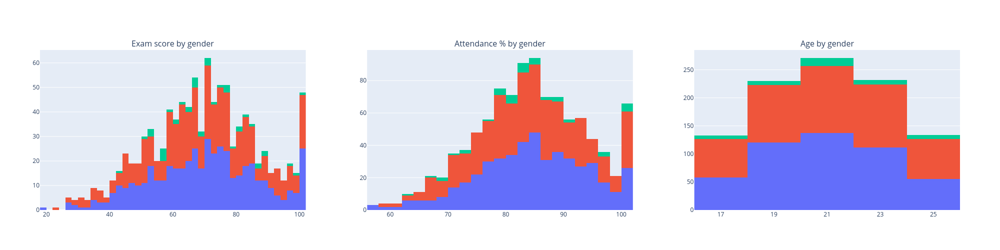

In [6]:
# Create subplot layout (4 columns, 2 rows for 6 plots)
fig = make_subplots(
    rows=1, cols=3,
    subplot_titles=[
        "Exam score by gender",
        "Attendance % by gender",
        "Age by gender"
    ]
)

# Histogram 1 - Exam score by gender
hist1 = px.histogram(sd, x="exam_score", color="gender", nbins=50)
for trace in hist1.data:
    fig.add_trace(trace, row=1, col=1)

# Histogram 2 - Attendance % by gender
hist2 = px.histogram(sd, x="attendance_percentage", color="gender", nbins=50)
for trace in hist2.data:
    fig.add_trace(trace, row=1, col=2)

# Histogram 3 - Age by gender
hist3 = px.histogram(sd, x="age", color="gender", nbins=50)
for trace in hist3.data:
    fig.add_trace(trace, row=1, col=3)
    
# Update layout
fig.update_layout(
    height=500,
    width=2000,  # Increased width for better visualization
    #title_text="Distributions of key variables by 'gender': 'exam_score', 'attendance_percentage', and 'age'",
    barmode="stack",
    showlegend=False
)

fig.write_image("img/distributions_exam_score_attendance_age_by_gender.png")

fig.show(renderer="png")

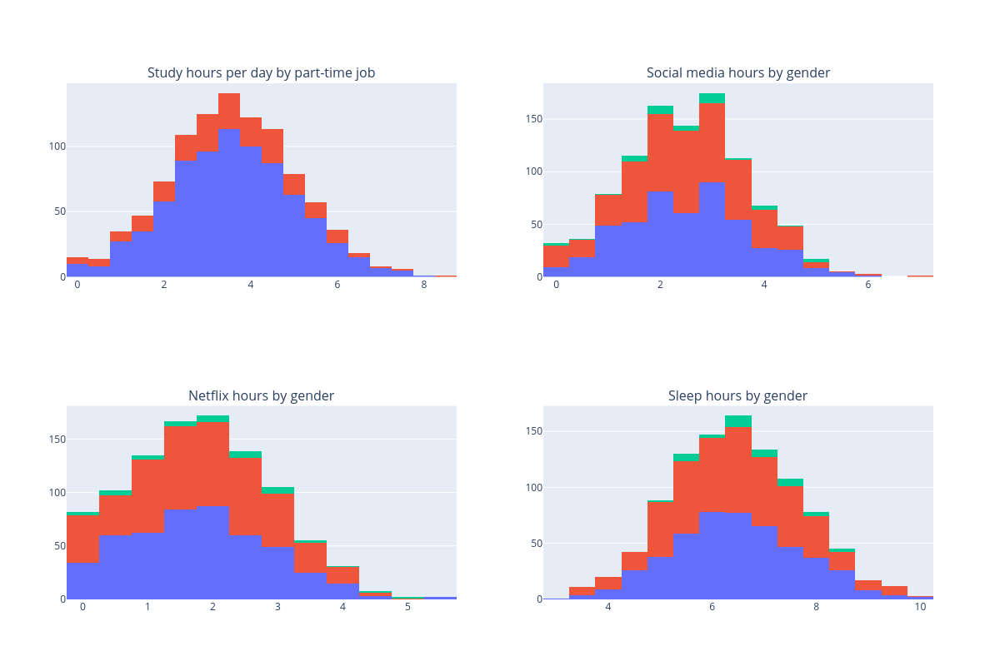

In [7]:
# Create subplot layout (2 rows, 2 columns for the histograms involving hours)
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=[
        "Study hours per day by part-time job",
        "Social media hours by gender",
        "Netflix hours by gender",
        "Sleep hours by gender"
    ]
)
# Histogram 1 - Study hours per day by part-time job with Gaussian fit
hist1 = px.histogram(sd, x="study_hours_per_day", color="part_time_job", nbins=50)
for trace in hist1.data:
    fig.add_trace(trace, row=1, col=1)

# Histogram 2 - Social media hours by gender with Gaussian fit
hist2 = px.histogram(sd, x="social_media_hours", color="gender", nbins=50)
for trace in hist2.data:
    fig.add_trace(trace, row=1, col=2)

# Histogram 3 - Netflix hours by gender with Gaussian fit
hist3 = px.histogram(sd, x="netflix_hours", color="gender", nbins=50)
for trace in hist3.data:
    fig.add_trace(trace, row=2, col=1)

# Histogram 4 - Sleep hours by gender with Gaussian fit
hist4 = px.histogram(sd, x="sleep_hours", color="gender", nbins=50)
for trace in hist4.data:
    fig.add_trace(trace, row=2, col=2)

# Update layout for the subplot
fig.update_layout(
    height=800,
    width=1200,  # Adjusted width for better visualization
    #title_text="Distributions of hours-related variables",
    barmode="stack",  # Stacked bars for comparison
    showlegend=False  # Show legend for better clarity
)

fig.write_image("img/distributions_hours_related_variables.png")

# Show the plot
fig.show(renderer="png")

The analysis reveals that **exam scores and attendance percentages are relatively consistent across gender groups**. Female, male, and other gender-identifying students all have **similar average exam scores, around 69–70**, with comparable ranges and maximum scores reaching 100. **Attendance rates are also high and closely aligned**, with females averaging 84.4% and males 83.9%. These results suggest **minimal gender-based disparities in academic performance and class engagement**. Notably, there is a **pronounced peak in exam scores within the 99–100 range**, with **28 females, 23 males, and 1 student identifying as other reaching this top bracket**. Similarly, **attendance percentages show a strong concentration at the upper end**, with **29 females, 39 males, and 5 students from the other category achieving near-perfect attendance**. This suggests a **segment of highly engaged and high-performing students across all gender groups**.

**Students with and without part-time jobs report nearly identical average study hours** (around **3.5 hours/day**), indicating that **having a job does not significantly reduce study time**. When it comes to screen time, **social media and Netflix usage are strikingly consistent across genders**, with only **slight increases among students identifying as "Other"**, who average **2.59 hours on social media** and **2.06 hours on Netflix**, compared to about **2.5 and 1.8 hours** for other groups. **Sleep patterns also show minimal variation**, with all groups averaging around **6.4 to 6.8 hours per night**; however, **students identifying as "Other" tend to sleep slightly more on average**. These findings suggest that, across the board, **students maintain a relatively balanced routine** in terms of studying, media consumption, and sleep, regardless of gender or employment status, with **no major disparities** observed in time use.

In [8]:
from scipy.stats import skew

# Method 2: Using scipy for more control
print("\nSkewness (scipy):")
for col in sd.select_dtypes(include=['number']).columns:
    print(f"{col}: {round(skew(sd[col], nan_policy='omit'), 4)}")


Skewness (scipy):
age: 0.0084
study_hours_per_day: 0.0542
social_media_hours: 0.1196
netflix_hours: 0.2368
attendance_percentage: -0.2375
sleep_hours: 0.0913
exercise_frequency: -0.0319
mental_health_rating: 0.0378
exam_score: -0.1561


The skewness values for the attributes in your dataset suggest that all distributions are **approximately symmetric** or only **mildly skewed**, with values close to zero. This means that the variables like `study_hours_per_day`, `social_media_hours`, and `netflix_hours` show **slight right skew**, while `exam_score` has a **minor left skew**. None of the attributes exceed the threshold typically used to flag significant skewness, so **no transformation** (like logarithmic or Box-Cox) is necessary at this stage.

For preprocessing, this implies you can proceed directly to **scaling or normalization** if required by your modeling algorithm. Models such as **tree-based learners are insensitive** to distribution shapes, while others like logistic regression or neural networks may benefit from standardized input. Overall, the skewness results indicate that the data is in a good shape distribution-wise and **no major corrective preprocessing** for skew is needed.

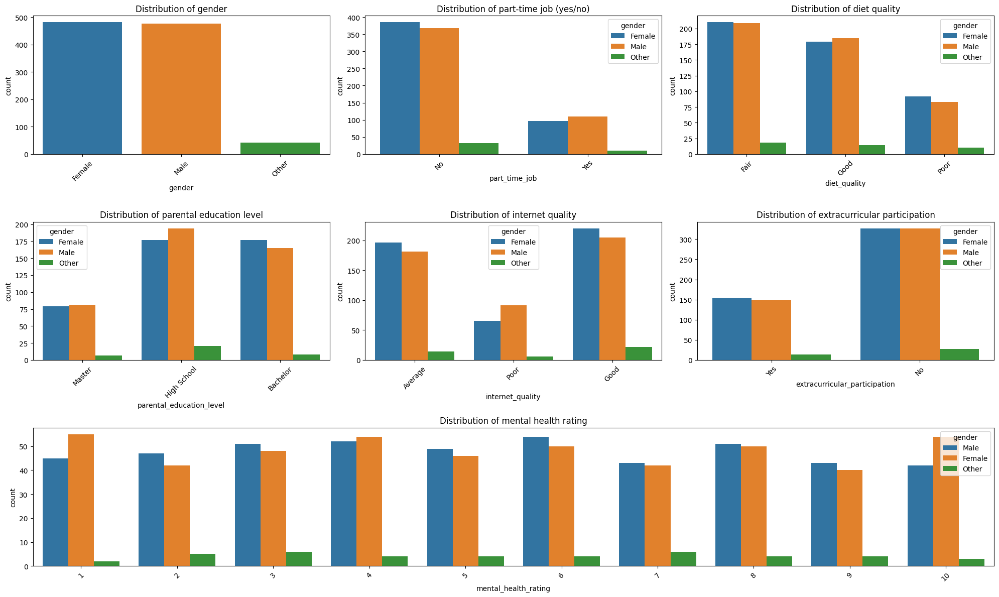

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec

# Set up figure size
fig = plt.figure(figsize=(20, 12))

# Create a GridSpec with 4 rows and 2 columns
gs = GridSpec(3, 3, figure=fig)

# Plot each categorical variable manually using GridSpec positioning
sns.countplot(data=sd, x="gender", hue="gender", ax=fig.add_subplot(gs[0, 0]))
plt.title("Distribution of gender")
plt.xticks(rotation=45)

sns.countplot(data=sd, x="part_time_job", hue="gender", ax=fig.add_subplot(gs[0, 1]))
plt.title("Distribution of part-time job (yes/no)")
plt.xticks(rotation=45)

sns.countplot(data=sd, x="diet_quality", hue="gender", ax=fig.add_subplot(gs[0, 2]))
plt.title("Distribution of diet quality")
plt.xticks(rotation=45)

sns.countplot(data=sd, x="parental_education_level", hue="gender", ax=fig.add_subplot(gs[1, 0]))
plt.title("Distribution of parental education level")
plt.xticks(rotation=45)

sns.countplot(data=sd, x="internet_quality", hue="gender", ax=fig.add_subplot(gs[1, 1]))
plt.title("Distribution of internet quality")
plt.xticks(rotation=45)

sns.countplot(data=sd, x="extracurricular_participation", hue="gender", ax=fig.add_subplot(gs[1, 2]))
plt.title("Distribution of extracurricular participation")
plt.xticks(rotation=45)

# Centering the last plot on the figure by using an empty position (gs[3, 0] and gs[3, 1])
sns.countplot(data=sd, x="mental_health_rating", hue="gender", ax=fig.add_subplot(gs[2, 0:3]))  # This spans the last row
plt.title("Distribution of mental health rating")
plt.xticks(rotation=45)

# Adjust layout to avoid overlap and give space to the centered plot
plt.tight_layout()

# Save the figure
plt.savefig('img/distribution_categorical_variables.png')

# Show the plot
plt.show()

The dataset reveals a **well-balanced distribution** between female and male students, with a **smaller group (42)** identifying as "Other." Most students, regardless of gender, **do not hold part-time jobs**, though **slightly more males (109)** do compared to females (96). **Diet quality is predominantly rated as fair**, with females reporting **slightly more poor diets** than males. **Parental education levels** show that **more males' parents have only a high school education**, while **more females report parents with bachelor's degrees**. **Internet quality** is generally **good or average**, but **poor connectivity is more common among male students**. **Participation in extracurricular activities is low overall**, with **two-thirds of students not involved**, despite **equal rates between females and males**. 

The **distribution of mental health ratings between females and males is quite balanced**, indicating **similar self-perceived mental well-being** across genders. Most ratings are **evenly spread**, with a **slight concentration around the mid-range (ratings 4 to 6)** for both groups. **Notably, both genders are represented at the extremes**, with a **non-negligible number rating their mental health as very poor (1–2) or excellent (9–10)**, highlighting the **diverse mental health experiences** present within the student population.

### **Visualizing, analyzing, and aggregating data for insights**

In this section, we will explore various techniques to visualize and analyze the collected data, transforming it into actionable insights. By aggregating key metrics and creating visual representations, we can uncover patterns, trends, and correlations that help us better understand how different lifestyle habits impact student performance. This process will enable us to identify areas where students may need targeted support and provide a clearer picture of factors contributing to academic success or challenges.

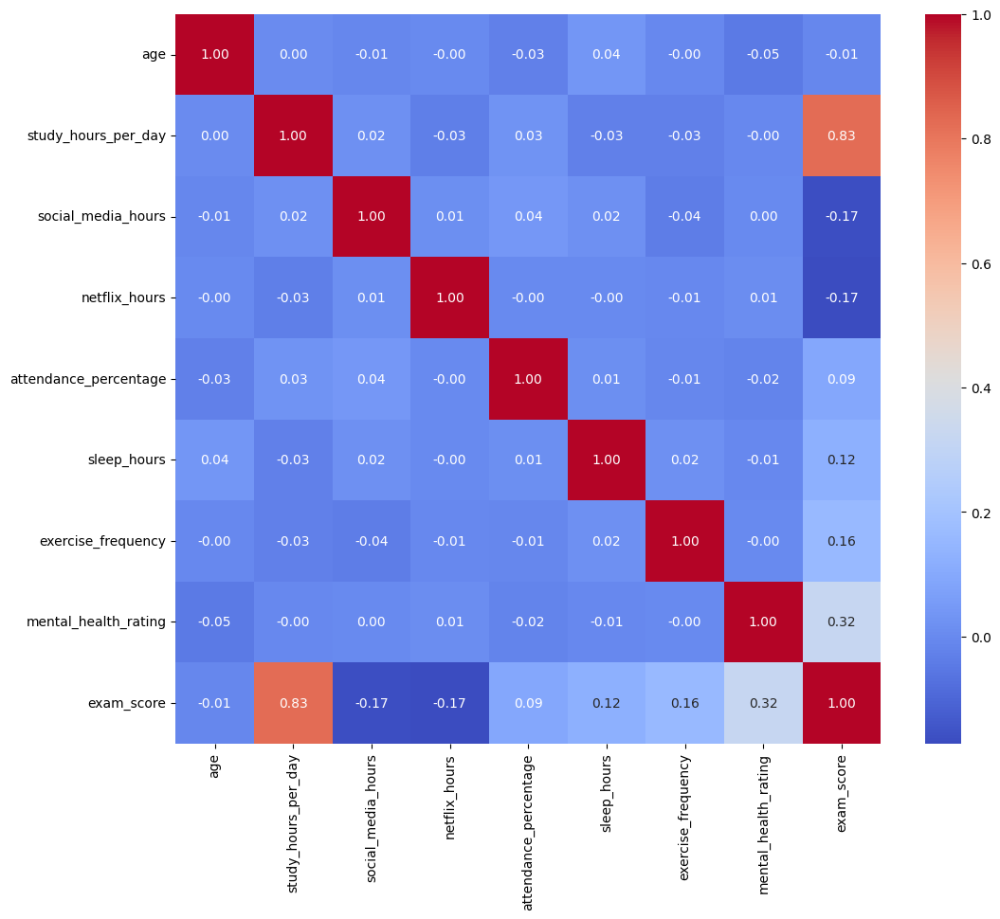

In [10]:
# Select numeric columns
sd_numeric_cols = sd.select_dtypes(include=['int64', 'float64']).columns
corr_matrix = sd[sd_numeric_cols].corr()

# Plot heatmap with annotations
plt.figure(figsize=(12,10))
sns.heatmap(corr_matrix, cmap="coolwarm", annot=True, fmt=".2f")
#plt.title("Correlation matrix (raw data)")

# Save the figure
plt.savefig("img/correlation_matrix.png", dpi=300, bbox_inches='tight')  # or .pdf/.jpg

# Show the plot
plt.show()

The **correlation matrix** reveals several key relationships in the dataset. **Study hours per day** show a strong positive correlation with **exam scores** (**0.83**), indicating that more time spent studying is linked to higher exam performance. Additionally, **mental health rating** and **exam score** are positively correlated (**0.32**), suggesting that better mental health may be associated with improved exam outcomes. On the other hand, there are very weak correlations between **age** and most other variables, including **exam scores** (**-0.01**). Furthermore, **social media hours** and **netflix hours** show negative correlations with **exam scores** (**-0.17**), which may imply that increased time spent on social media or watching Netflix could slightly hinder academic performance. **Attendance percentage** also shows a weak positive correlation with **exam score** (**0.09**), suggesting that better attendance may have a minor, yet positive impact on performance. Most other relationships are weak or negligible, such as those between **exercise frequency** and **exam scores** (**0.16**).

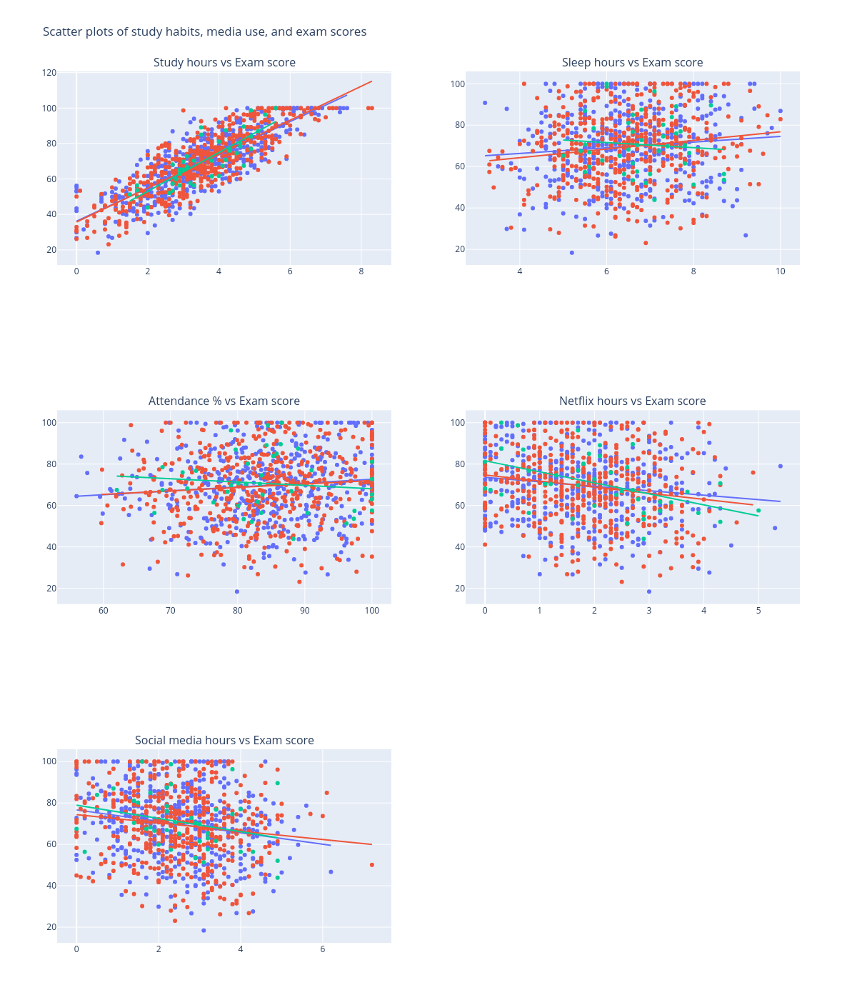

In [11]:
# Create subplot layout (3 rows, 2 columns for 5 scatter plots)
fig = make_subplots(
    rows=3, cols=2,
    subplot_titles=[
        "Study hours vs Exam score",
        "Sleep hours vs Exam score",
        "Attendance % vs Exam score",
        "Netflix hours vs Exam score",
        "Social media hours vs Exam score"
    ]
)

# 1. Study hours vs exam score
scatter1 = px.scatter(sd, x="study_hours_per_day", y="exam_score", color="gender", trendline="ols")
for trace in scatter1.data:
    fig.add_trace(trace, row=1, col=1)

# 2. Sleep hours vs exam score
scatter2 = px.scatter(sd, x="sleep_hours", y="exam_score", color="gender", trendline="ols")
for trace in scatter2.data:
    fig.add_trace(trace, row=1, col=2)

# 3. Attendance % vs exam score
scatter3 = px.scatter(sd, x="attendance_percentage", y="exam_score", color="gender", trendline="ols")
for trace in scatter3.data:
    fig.add_trace(trace, row=2, col=1)

# 4. Netflix hours vs attendance %
scatter4 = px.scatter(sd, x="netflix_hours", y="exam_score", color="gender", trendline="ols")
for trace in scatter4.data:
    fig.add_trace(trace, row=2, col=2)

# 5. Netflix hours vs exam score
scatter5 = px.scatter(sd, x="social_media_hours", y="exam_score", color="gender", trendline="ols")
for trace in scatter5.data:
    fig.add_trace(trace, row=3, col=1)

# Update layout
fig.update_layout(
    height=1400,
    width=1200,
    title_text="Scatter plots of study habits, media use, and exam scores",
    showlegend=False
)

fig.write_image("img/scatter_plots_study_habits_media_use_exam_scores.png")

fig.show(renderer="png")

**Study hours** are the strongest predictor of exam performance across all students. Regardless of gender, the relationship is highly consistent: more study time clearly leads to better scores. The slope of the trendline is slightly steeper for students identifying as "Other," but in general, all groups see an increase of about **9 to 11 points** for each additional hour of study per day. The **R² values**, which indicate how well study hours predict exam scores, are quite high across the board,around **0.67 to 0.69**,demonstrating a strong and reliable correlation.

**Sleep hours**, on the other hand, show very little influence on exam outcomes. The relationships are weak and inconsistent, with low **R² values below 0.03** for all groups. While there's a slight positive trend for male and female students,indicating that more sleep might slightly improve scores,the connection is not strong enough to be considered meaningful. For students identifying as "Other," the trend is slightly negative, but this too appears statistically insignificant.

**Attendance percentages**, although often assumed to be a key to academic success, surprisingly show minimal impact on exam scores. The trendlines are nearly flat, with extremely low **R² values** across all genders. Even at high attendance levels, the increase in exam score is only marginal, suggesting that merely being present does not guarantee academic achievement in this dataset.

**Netflix viewing time** reveals a modest but clearer **negative trend**. As students spend more hours watching Netflix, their exam scores tend to drop. The effect is most pronounced for the **"Other" gender group**, where the decline is over **5 points per hour** and the **R² value** is relatively higher at **0.238**. While the trend is weaker for male and female students, the pattern remains consistent,less screen time on Netflix is generally associated with better academic performance.

**Social media usage** follows a similar downward trend. Students who spend more time on social platforms tend to have slightly lower exam scores. The impact varies, with the steepest decline among female students, but the pattern holds for all groups. While the **R² values** are not particularly high, they are still higher than those observed for sleep or attendance, suggesting that social media may have a mild but real effect on performance.

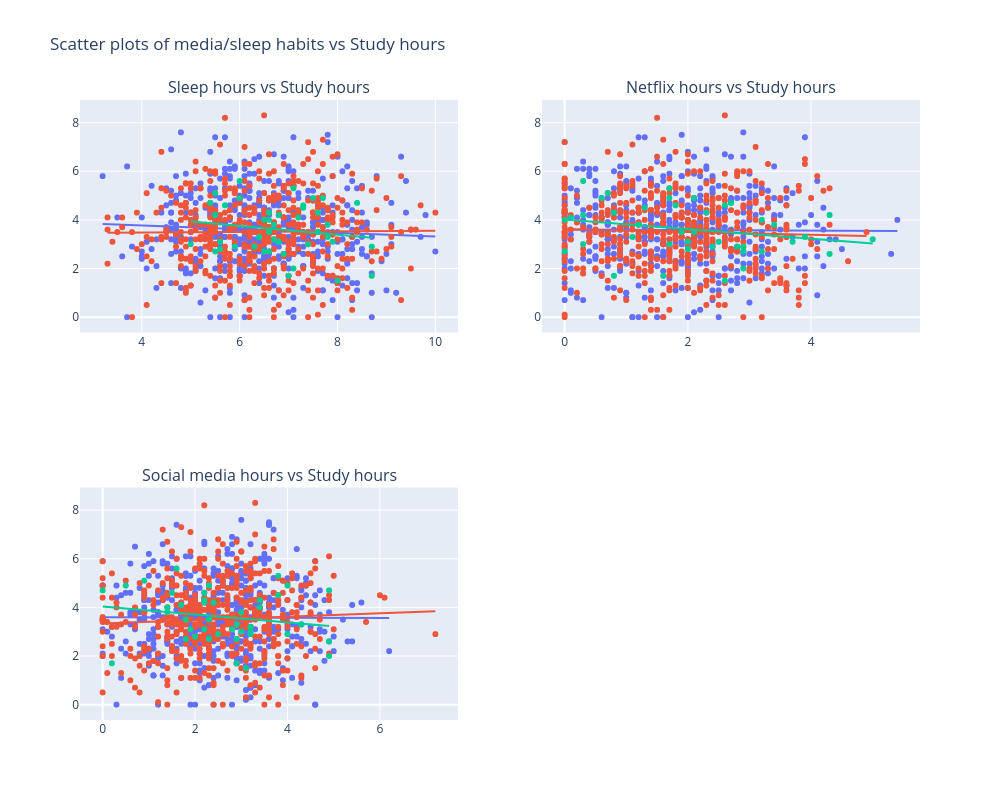

In [12]:
# Create subplot layout (2 rows, 2 columns , since we only have 3 plots)
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=[
        "Sleep hours vs Study hours",
        "Netflix hours vs Study hours",
        "Social media hours vs Study hours"
    ]
)

# 1. Sleep hours vs Study hours
scatter1 = px.scatter(sd, x="sleep_hours", y="study_hours_per_day", color="gender", trendline="ols")
for trace in scatter1.data:
    fig.add_trace(trace, row=1, col=1)

# 2. Netflix hours vs Study hours
scatter2 = px.scatter(sd, x="netflix_hours", y="study_hours_per_day", color="gender", trendline="ols")
for trace in scatter2.data:
    fig.add_trace(trace, row=1, col=2)

# 3. Social media hours vs Study hours
scatter3 = px.scatter(sd, x="social_media_hours", y="study_hours_per_day", color="gender", trendline="ols")
for trace in scatter3.data:
    fig.add_trace(trace, row=2, col=1)

# Update layout
fig.update_layout(
    height=800,
    width=1000,
    title_text="Scatter plots of media/sleep habits vs Study hours",
    showlegend=False
)

fig.write_image("img/scatter_plots_sleep_media_vs_study_hours.png")

fig.show(renderer="png")

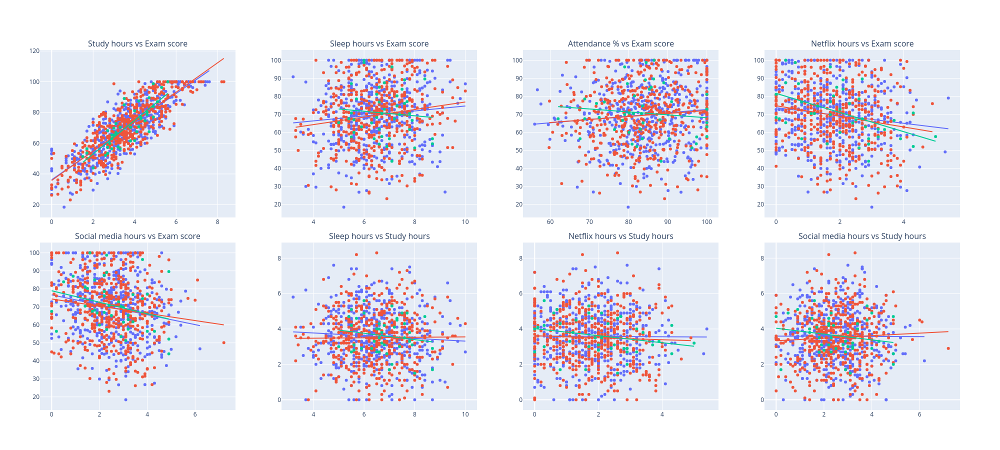

In [13]:
# Create subplot layout (3 rows, 2 columns for 5 scatter plots)
fig = make_subplots(
    rows=2, cols=4,
    vertical_spacing=0.07,  # Reduced from default (0.3) to make rows closer
    subplot_titles=[
        "Study hours vs Exam score",
        "Sleep hours vs Exam score",
        "Attendance % vs Exam score",
        "Netflix hours vs Exam score",
        "Social media hours vs Exam score",
        "Sleep hours vs Study hours",
        "Netflix hours vs Study hours",
        "Social media hours vs Study hours"
    ]
)

# 1. Study hours vs exam score
scatter1 = px.scatter(sd, x="study_hours_per_day", y="exam_score", color="gender", trendline="ols")
for trace in scatter1.data:
    fig.add_trace(trace, row=1, col=1)

# 2. Sleep hours vs exam score
scatter2 = px.scatter(sd, x="sleep_hours", y="exam_score", color="gender", trendline="ols")
for trace in scatter2.data:
    fig.add_trace(trace, row=1, col=2)

# 3. Attendance % vs exam score
scatter3 = px.scatter(sd, x="attendance_percentage", y="exam_score", color="gender", trendline="ols")
for trace in scatter3.data:
    fig.add_trace(trace, row=1, col=3)

# 4. Netflix hours vs attendance %
scatter4 = px.scatter(sd, x="netflix_hours", y="exam_score", color="gender", trendline="ols")
for trace in scatter4.data:
    fig.add_trace(trace, row=1, col=4)

# 5. Netflix hours vs exam score
scatter5 = px.scatter(sd, x="social_media_hours", y="exam_score", color="gender", trendline="ols")
for trace in scatter5.data:
    fig.add_trace(trace, row=2, col=1)


# 6. Sleep hours vs Study hours
scatter6 = px.scatter(sd, x="sleep_hours", y="study_hours_per_day", color="gender", trendline="ols")
for trace in scatter6.data:
    fig.add_trace(trace, row=2, col=2)

# 2. Netflix hours vs Study hours
scatter7 = px.scatter(sd, x="netflix_hours", y="study_hours_per_day", color="gender", trendline="ols")
for trace in scatter7.data:
    fig.add_trace(trace, row=2, col=3)

# 3. Social media hours vs Study hours
scatter8 = px.scatter(sd, x="social_media_hours", y="study_hours_per_day", color="gender", trendline="ols")
for trace in scatter8.data:
    fig.add_trace(trace, row=2, col=4)

# Update layout
fig.update_layout(
    height=900,
    width=2000,
    #title_text="Scatter plots of study habits, media use, and exam scores",
    showlegend=False
)

fig.write_image("img/scatter_plots.png")

fig.show(renderer="png")

The scatter plot analyses and OLS trendline results suggest that there is **very little to no meaningful relationship** between sleep hours, Netflix usage, or social media usage and the amount of time students spend studying per day. Across the board, the coefficients of determination (R²) are extremely low, indicating that these variables explain **virtually none of the variance** in study time. In other words, knowing how much someone sleeps or how much time they spend on media consumption does not help in predicting how much they study.

The direction of the trendlines , whether slightly positive or negative , varies somewhat, but the slopes are generally close to zero. This means that even when there is a trend, the effect size is minimal. For example, a negative slope might suggest that more time on Netflix is associated with slightly less study time, but the change is so small that it's not practically significant. These weak associations are consistent across most subgroups, with only one or two exceptions that still fall short of meaningful predictive value.

Overall, these results point to the conclusion that **sleep and media consumption habits, on their own, do not strongly influence daily study time**. Other factors , such as motivation, personal discipline, academic goals, or external responsibilities , are likely to play a much more substantial role in shaping study behavior. These findings can help inform where to focus further analysis or interventions, suggesting that reducing screen time may not directly boost study time unless it's part of a broader strategy addressing more influential factors.

In [14]:
from scipy.stats import spearmanr, kendalltau

# 1. Spearman correlation
rho, pval_rho = spearmanr(sd['mental_health_rating'], sd['exam_score'])
print(f"Spearman’s ρ = {rho:.3f}, p‑value = {pval_rho:.4f}")

# 2. Kendall’s tau
tau, pval_tau = kendalltau(sd['mental_health_rating'], sd['exam_score'])
print(f"Kendall’s τ = {tau:.3f}, p‑value = {pval_tau:.4f}")

# 3. (Optional) Group‐by summary to see median/iqr at each level
summary = sd.groupby('mental_health_rating')['exam_score'] \
            .agg(count='count', median='median', iqr=lambda x: x.quantile(0.75)-x.quantile(0.25))
print("\nExam score by mental‐health rating (median & IQR):")
print(summary)

Spearman’s ρ = 0.323, p‑value = 0.0000
Kendall’s τ = 0.228, p‑value = 0.0000

Exam score by mental‐health rating (median & IQR):
                      count  median     iqr
mental_health_rating                       
1                       102   62.75  23.450
2                        94   63.80  17.675
3                       105   64.60  20.200
4                       110   66.90  26.400
5                        99   68.30  21.500
6                       108   70.80  19.250
7                        91   73.00  22.850
8                       105   74.00  24.500
9                        87   76.10  16.100
10                       99   79.90  22.450


**Spearman’s ρ**, which measures how well two variables move together in the same direction (i.e. a higher rating tends to go with a higher score), is **0.323** (p < 0.001), indicating a moderate positive monotonic relationship between mental‑health rating and exam performance. **Kendall’s τ**, an index of the agreement between pairwise rankings, is **0.228** (p < 0.001), likewise confirming a significant positive association. Looking at the medians, exam scores steadily rise from **62.75** at a mental‑health rating of 1 to **79.90** at a rating of 10, with interquartile ranges remaining substantial, showing that, while individual variability exists, students who report better mental health generally achieve higher exam scores.

In [15]:
# 1. Spearman correlation with Netflix hours and social media hours
rho_netflix, pval_rho_netflix = spearmanr(sd['mental_health_rating'], sd['netflix_hours'])
rho_social_media, pval_rho_social_media = spearmanr(sd['mental_health_rating'], sd['social_media_hours'])

print(f"Spearman’s ρ between mental health and Netflix hours = {rho_netflix:.3f}, p‑value = {pval_rho_netflix:.4f}")
print(f"Spearman’s ρ between mental health and Social Media hours = {rho_social_media:.3f}, p‑value = {pval_rho_social_media:.4f}")

# 2. Kendall’s tau with Netflix hours and social media hours
tau_netflix, pval_tau_netflix = kendalltau(sd['mental_health_rating'], sd['netflix_hours'])
tau_social_media, pval_tau_social_media = kendalltau(sd['mental_health_rating'], sd['social_media_hours'])

print(f"Kendall’s τ between mental health and Netflix hours = {tau_netflix:.3f}, p‑value = {pval_tau_netflix:.4f}")
print(f"Kendall’s τ between mental health and Social Media hours = {tau_social_media:.3f}, p‑value = {pval_tau_social_media:.4f}")

Spearman’s ρ between mental health and Netflix hours = 0.003, p‑value = 0.9344
Spearman’s ρ between mental health and Social Media hours = -0.004, p‑value = 0.8964
Kendall’s τ between mental health and Netflix hours = 0.001, p‑value = 0.9477
Kendall’s τ between mental health and Social Media hours = -0.003, p‑value = 0.9000


The analysis between **mental health ratings and Netflix hours** reveals an **almost negligible relationship**. Both **Spearman's correlation (ρ = 0.003)** and **Kendall’s tau (τ = 0.001)** indicate that there is **no meaningful correlation** between these two variables. The **p-values (0.9344 for Spearman and 0.9477 for Kendall's tau)** are **much higher than the standard significance level of 0.05**, suggesting that any observed correlation is **not statistically significant**. This implies that, in this dataset, the **number of hours spent on Netflix does not appear to have any meaningful association with mental health ratings**, and other factors might influence mental health more significantly than Netflix usage.

Similarly, the relationship between **mental health ratings and social media hours** is **virtually nonexistent**. The **Spearman correlation coefficient is -0.004**, and **Kendall’s tau is -0.003**, both of which are **very close to zero**, indicating **no strong correlation**. The **p-values (0.8964 for Spearman and 0.9000 for Kendall’s tau)** are **far above the threshold of 0.05**, which confirms the **lack of statistical significance**. This suggests that **social media usage does not exhibit a meaningful association with mental health ratings** in this dataset, indicating that the **time spent on social media might not be a determining factor** in mental health outcomes for this group of individuals.

In [16]:
# 3. (Optional) Group‐by summary to see median/iqr at each level
summary = sd.groupby('mental_health_rating').agg(
    netflix_hours_count=('netflix_hours', 'count'),
    netflix_hours_median=('netflix_hours', 'median'),
    netflix_hours_iqr=('netflix_hours', lambda x: x.quantile(0.75)-x.quantile(0.25)),
    social_media_hours_count=('social_media_hours', 'count'),
    social_media_hours_median=('social_media_hours', 'median'),
    social_media_hours_iqr=('social_media_hours', lambda x: x.quantile(0.75)-x.quantile(0.25))
)

print("\nNetflix and Social Media hours by mental‐health rating (count, median & IQR):")
print(summary)


Netflix and Social Media hours by mental‐health rating (count, median & IQR):
                      netflix_hours_count  netflix_hours_median  \
mental_health_rating                                              
1                                     102                  1.70   
2                                      94                  1.85   
3                                     105                  1.70   
4                                     110                  1.80   
5                                      99                  1.90   
6                                     108                  1.95   
7                                      91                  1.60   
8                                     105                  1.90   
9                                      87                  1.50   
10                                     99                  1.90   

                      netflix_hours_iqr  social_media_hours_count  \
mental_health_rating                           



The **group-by summary of Netflix and social media hours by mental health rating** provides some insight into how these activities vary across different mental health ratings. The **median Netflix hours** across all mental health ratings **range from 1.50 to 1.95 hours**, showing **little variation**, and the **interquartile range (IQR) values are relatively consistent**, indicating **moderate variation**. In terms of **social media hours**, the **median ranges from 2.40 to 2.80 hours**, with **slight increases in social media usage** observed at higher mental health ratings. However, the **IQR for social media hours (1.40 to 1.85)** shows that there's **more variability in the time spent on social media compared to Netflix**, though the overall differences are **not extreme**. These findings highlight that while there is **some variation in time spent on these platforms across different mental health ratings**, these **differences are not substantial enough** to suggest any **strong relationships with mental health ratings**.

In [17]:
# Make a copy to avoid changing original data
sdc = sd.copy()

# Ordinal mapping for 'diet_quality'
diet_map = {'Poor': 1, 'Fair': 2, 'Good': 3}
sdc['diet_quality_ordinal'] = sdc['diet_quality'].map(diet_map)

# Handle 'parental_education_level' with 'Unknown' as separate category
sdc['parental_education_level'] = sdc['parental_education_level'].fillna('Unknown')
education_map = {'High School': 1, 'Bachelor': 2, 'Master': 3, 'Unknown': 0}
sdc['parental_education_ordinal'] = sdc['parental_education_level'].map(education_map)

# Ordinal mapping for 'internet_quality'
internet_map = {'Poor': 1, 'Average': 2, 'Good': 3}
sdc['internet_quality_ordinal'] = sdc['internet_quality'].map(internet_map)

# Spearman correlation between diet_quality_ordinal and exam_score
rho_diet_exam, pval_diet_exam = spearmanr(sdc['diet_quality_ordinal'], sdc['exam_score'])
print(f"Spearman’s ρ between diet_quality and exam_score = {rho_diet_exam:.3f}, p-value = {pval_diet_exam:.4f}")

# Spearman correlation between parental_education_ordinal and exam_score
rho_education_exam, pval_education_exam = spearmanr(sdc['parental_education_ordinal'], sdc['exam_score'])
print(f"Spearman’s ρ between parental_education and exam_score = {rho_education_exam:.3f}, p-value = {pval_education_exam:.4f}")

# Spearman correlation between internet_quality_ordinal and exam_score
rho_internet_exam, pval_internet_exam = spearmanr(sdc['internet_quality_ordinal'], sdc['exam_score'])
print(f"Spearman’s ρ between internet_quality and exam_score = {rho_internet_exam:.3f}, p-value = {pval_internet_exam:.4f}")

# Kendall’s tau correlation between diet_quality_ordinal and exam_score
tau_diet_exam, pval_tau_diet_exam = kendalltau(sdc['diet_quality_ordinal'], sdc['exam_score'])
print(f"Kendall’s τ between diet_quality and exam_score = {tau_diet_exam:.3f}, p-value = {pval_tau_diet_exam:.4f}")

# Kendall’s tau correlation between parental_education_ordinal and exam_score
tau_education_exam, pval_tau_education_exam = kendalltau(sdc['parental_education_ordinal'], sdc['exam_score'])
print(f"Kendall’s τ between parental_education and exam_score = {tau_education_exam:.3f}, p-value = {pval_tau_education_exam:.4f}")

# Kendall’s tau correlation between internet_quality_ordinal and exam_score
tau_internet_exam, pval_tau_internet_exam = kendalltau(sdc['internet_quality_ordinal'], sdc['exam_score'])
print(f"Kendall’s τ between internet_quality and exam_score = {tau_internet_exam:.3f}, p-value = {pval_tau_internet_exam:.4f}")


# Optional: Group-by summary of 'exam_score' based on each of these ordinal variables
summary_diet = sdc.groupby('diet_quality_ordinal')['exam_score'] \
            .agg(count='count', median='median', iqr=lambda x: x.quantile(0.75)-x.quantile(0.25))
print("\nExam score by diet quality (median & IQR):")
print(summary_diet)

summary_education = sdc.groupby('parental_education_ordinal')['exam_score'] \
            .agg(count='count', median='median', iqr=lambda x: x.quantile(0.75)-x.quantile(0.25))
print("\nExam score by parental education level (median & IQR):")
print(summary_education)

summary_internet = sdc.groupby('internet_quality_ordinal')['exam_score'] \
            .agg(count='count', median='median', iqr=lambda x: x.quantile(0.75)-x.quantile(0.25))
print("\nExam score by internet quality (median & IQR):")
print(summary_internet)

Spearman’s ρ between diet_quality and exam_score = 0.014, p-value = 0.6634
Spearman’s ρ between parental_education and exam_score = -0.022, p-value = 0.4950
Spearman’s ρ between internet_quality and exam_score = -0.046, p-value = 0.1479
Kendall’s τ between diet_quality and exam_score = 0.010, p-value = 0.6739
Kendall’s τ between parental_education and exam_score = -0.016, p-value = 0.4944
Kendall’s τ between internet_quality and exam_score = -0.035, p-value = 0.1538

Exam score by diet quality (median & IQR):
                      count  median    iqr
diet_quality_ordinal                      
1                       185    67.4  22.00
2                       437    71.0  23.00
3                       378    70.3  22.85

Exam score by parental education level (median & IQR):
                            count  median     iqr
parental_education_ordinal                       
0                              91   71.00  21.400
1                             392   69.95  24.025
2             

The correlation analysis reveals very weak relationships between the ordinal attributes and **exam scores**. Spearman’s ρ and Kendall’s τ values for **diet quality**, **parental education**, and **internet quality** with exam scores are close to zero, with p-values well above the typical significance threshold (0.05). This indicates that none of these ordinal variables have a statistically significant monotonic relationship with **exam scores**.

Exam score distributions show some minor differences across the levels of each ordinal attribute, but these differences are not large. For **diet quality**, the median exam score is highest for those with a **Fair** diet (71.0), with minimal variation across diet quality levels. **Parental education** level seems to slightly affect exam scores, with the **Bachelor’s** and **High School** groups showing higher medians, though the difference is small. Lastly, **internet quality** has a minor impact, with the **Poor** internet group having slightly higher median scores (71.4).

Despite these small differences, the weak correlations and relatively similar exam scores across levels suggest that **diet quality**, **parental education**, and **internet quality** do not strongly influence **exam scores** in this dataset. The variation in scores within each category further supports the conclusion that these factors are not key determinants of academic performance in this context.

#### **Outliers**

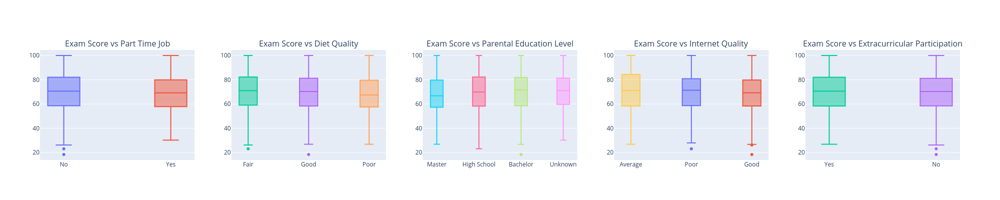

In [20]:
import plotly.io as pio

# Create a copy to avoid changing the original data
sdc = sd.copy()

# Fill missing values
sdc['parental_education_level'] = sdc['parental_education_level'].fillna('Unknown')

# Define categorical columns
categorical_cols = [
    'part_time_job', 
    'diet_quality', 
    'parental_education_level', 
    'internet_quality', 
    'extracurricular_participation'
]

# Set up subplot layout (3 rows, 2 columns)
fig = make_subplots(
    rows=1, cols=5,
    subplot_titles=[f"Exam Score vs {col.replace('_', ' ').title()}" for col in categorical_cols]
)

# Add box plots to each subplot
for i, col in enumerate(categorical_cols):
    row = i // 5 + 1
    col_pos = i % 5 + 1
    for category in sdc[col].unique():
        filtered = sdc[sdc[col] == category]
        fig.add_trace(
            go.Box(
                y=filtered["exam_score"],
                name=str(category),
                boxpoints='outliers',
                showlegend=False,
                width=0.3 
            ),
            row=row, col=col_pos
        )

# Update layout
fig.update_layout(
    height=400,
    width=2000,
    #title_text="Box Plots of Exam Score by Categorical Variables (with Outliers)",
    boxmode="group"
)

pio.write_image(fig, "img/boxplot_exam_score_categorical_variables.png", format="png", width=2000, height=400)


fig.show(renderer="png")

Overall, students **without a part-time job** tend to perform slightly better on average (**69.84**) compared to those with a job (**68.74**), though both groups have similar score distributions, with perfect scores of **100**. When it comes to diet quality, a clear trend emerges: students with a **Fair** diet quality score the highest (**70.43**), followed by those with **Good** (**69.37**) and **Poor** (**68.13**) diets. Similarly, students whose parents have a **Bachelor’s degree** show the highest average scores (**70.27**), while those with **High School** education average slightly lower (**69.55**), and students with **Master’s** degrees score the lowest (**68.09**). Interestingly, students with **Unknown** parental education still achieve relatively high scores (**70.03**), suggesting other factors may play a role in performance.

In terms of internet quality, students with **Average** internet quality outperform those with **Good** or **Poor** connections, averaging **70.64** compared to **68.65** and **69.72**, respectively. This could indicate that factors beyond internet speed, such as focus or screen time, are influencing exam performance. Finally, extracurricular participation appears to have little impact on exam scores, as students who participate (**69.62**) perform similarly to those who do not (**69.59**), with nearly identical medians and score distributions. This suggests that extracurricular activities have a minimal effect on academic outcomes in this dataset.

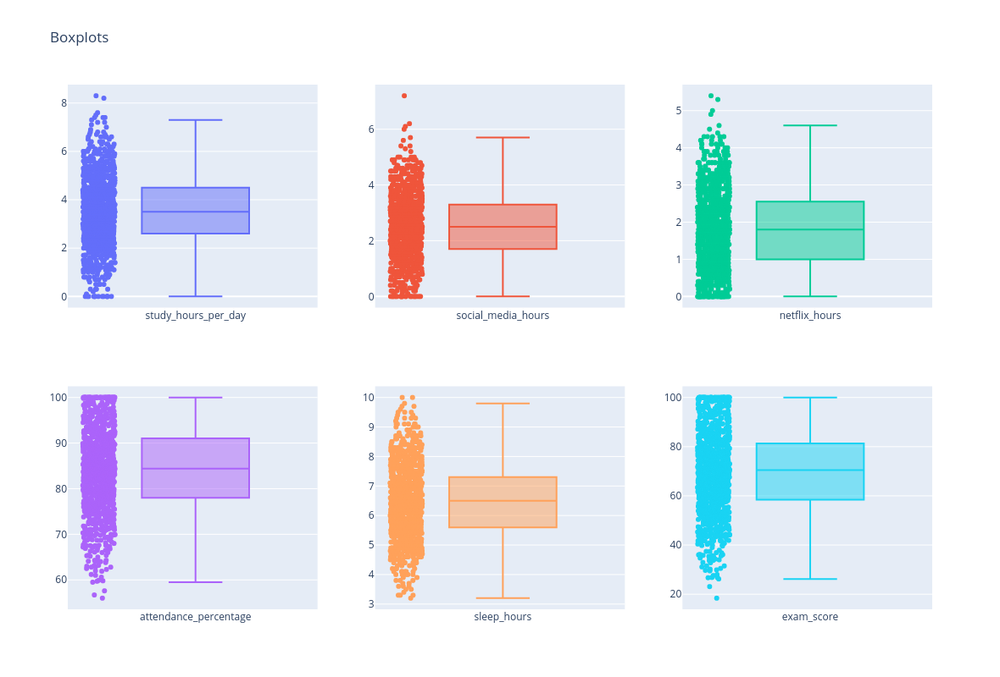

In [28]:
# List of numerical columns
numerical_columns = ['study_hours_per_day', 'social_media_hours', 'netflix_hours', 'attendance_percentage', 
                     'sleep_hours', 'exam_score']

# Create subplots
fig = make_subplots(rows=2, cols=3)

# Iterate over numerical columns and create boxplots
for i, col in enumerate(numerical_columns, 1):
    row = (i - 1) // 3 + 1
    col_idx = (i - 1) % 3 + 1
    
    # Calculate boxplot stats using pandas
    box_stats = sd[col].describe()
    lower_whisker = box_stats['25%'] - 1.5 * (box_stats['75%'] - box_stats['25%'])
    upper_whisker = box_stats['75%'] + 1.5 * (box_stats['75%'] - box_stats['25%'])
    
    # Get outliers
    outliers = sd[col][(sd[col] < lower_whisker) | (sd[col] > upper_whisker)].tolist()
    
    # Create hover text to display numerical values
    hovertext = (
        f'Min: {box_stats["min"]}<br>'  # Min value
        f'Q1: {box_stats["25%"]}<br>'   # 25th percentile
        f'Median: {box_stats["50%"]}<br>'  # Median
        f'Q3: {box_stats["75%"]}<br>'   # 75th percentile
        f'Max: {box_stats["max"]}<br>'  # Max value
        f'Outliers: {outliers}'  # Outliers
    )
    
    # Create a boxplot trace
    trace = go.Box(
        y=sd[col],
        name=col,
        boxpoints='all',  # Show all points (including outliers)
        jitter=0.3,
        pointpos=-1.8,
        hovertext=hovertext,  # Display numerical insights on hover
        hoverinfo='text+y+name'
    )
    
    # Add the trace to the subplot
    fig.add_trace(trace, row=row, col=col_idx)

# Update layout
fig.update_layout(
    title="Boxplots",
    height=800,
    width=1180,
    showlegend=False,
)

fig.show(renderer="png")

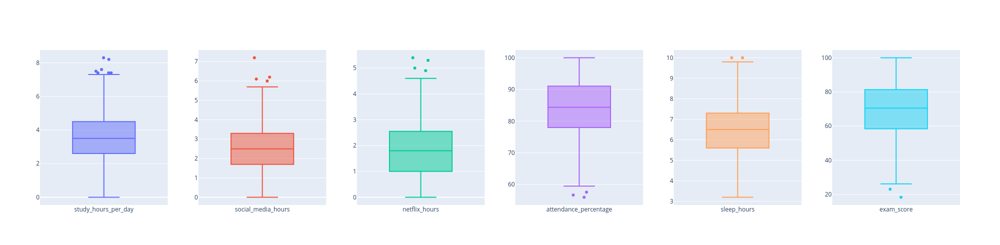

In [32]:
# List of numerical columns
numerical_columns = ['study_hours_per_day', 'social_media_hours', 'netflix_hours', 'attendance_percentage', 
                     'sleep_hours', 'exam_score']

# Create subplots
fig = make_subplots(rows=1, cols=6)

# Iterate over numerical columns and create boxplots
for i, col in enumerate(numerical_columns, 1):
    row = (i - 1) // 6 + 1
    col_idx = (i - 1) % 6 + 1
    
    # Calculate boxplot stats using pandas
    box_stats = sd[col].describe()
    lower_whisker = box_stats['25%'] - 1.5 * (box_stats['75%'] - box_stats['25%'])
    upper_whisker = box_stats['75%'] + 1.5 * (box_stats['75%'] - box_stats['25%'])
    
    # Get outliers
    outliers = sd[col][(sd[col] < lower_whisker) | (sd[col] > upper_whisker)].tolist()
    
    # Create hover text to display numerical values
    hovertext = (
        f'Min: {box_stats["min"]}<br>'  # Min value
        f'Q1: {box_stats["25%"]}<br>'   # 25th percentile
        f'Median: {box_stats["50%"]}<br>'  # Median
        f'Q3: {box_stats["75%"]}<br>'   # 75th percentile
        f'Max: {box_stats["max"]}<br>'  # Max value
        f'Outliers: {outliers}'  # Outliers
    )
    
    # Create a boxplot trace
    trace = go.Box(
        y=sd[col],
        name=col,
        boxpoints='outliers',  # Show all points (including outliers)
        jitter=0.3,
        #hovertext=hovertext,  # Display numerical insights on hover
        hoverinfo='text+y+name'
    )
    
    # Add the trace to the subplot
    fig.add_trace(trace, row=row, col=col_idx)

# Update layout
fig.update_layout(
    #title="Boxplots",
    height=490,
    width=2000,
    showlegend=False,
)

pio.write_image(fig, "img/boxplot_exam_score_numerical_variables.png", format="png", width=2000, height=400)

fig.show(renderer="png")



The data reveals distinct patterns across various variables. For **study_hours_per_day**, most individuals report spending between 2.6 and 4.5 hours studying, with outliers at values as high as 7.4 and 8.3 hours. This suggests that while the majority of the group spends a modest amount of time studying, a few individuals are significantly more engaged. Similarly, **social_media_hours** is generally concentrated between 1.7 and 3.3 hours, with outliers at higher values like 6.2 and 7.2, indicating that some individuals are spending far more time on social media than the norm. A similar pattern is seen in **netflix_hours**, where most individuals watch between 1.0 and 2.5 hours, but a small number of outliers exceed 5 hours of Netflix consumption.

In contrast, **attendance_percentage** shows a relatively higher concentration, with the majority of students attending classes between 78% and 91%. The presence of outliers at lower attendance values (around 56%) suggests some students are falling behind. **Sleep_hours** displays a relatively compact distribution between 5.6 and 7.3 hours, but a few individuals are getting 10 hours of sleep, which may be considered excessive. Finally, **exam_score** shows significant variability, with scores ranging from 18.4 to 100, and the majority of scores clustered between 58.5 and 81.3. The outliers at the lower end of the distribution (18.4 and 23.1) point to individuals with much lower scores than the rest, which could indicate areas requiring attention or improvement.

Overall, the data highlights trends in typical behavior patterns, but also exposes outliers who deviate significantly from the group. While most variables show tight distributions, **exam_score** and **attendance_percentage** reveal greater variability, with some individuals performing much worse than their peers. Understanding these patterns can help in identifying areas where targeted interventions might be needed, particularly for individuals at the extremes of each distribution.

In [33]:
# Drop the 'student_id' column from the DataFrame (if it exists)
sd = sd.drop(columns=['student_id'], errors='ignore')  # Ignore error if 'student_id' is not found

# Select only numeric columns from the DataFrame (excluding 'student_id')
numeric_columns = sd.select_dtypes(include=[np.number]).columns

# Define a function to calculate Z-scores
def calculate_z_scores(sd, numeric_columns):
    z_scores = np.abs(stats.zscore(sd[numeric_columns]))  # Calculate Z-scores for numeric columns
    return z_scores

# Define a function to calculate IQR method
def calculate_iqr(sd, numeric_columns):
    Q1 = sd[numeric_columns].quantile(0.25)
    Q3 = sd[numeric_columns].quantile(0.75)
    IQR = Q3 - Q1
    return (sd[numeric_columns] < (Q1 - 1.5 * IQR)) | (sd[numeric_columns] > (Q3 + 1.5 * IQR))

# Method 1: Z-Score Outliers Detection (Using a threshold of 3)
z_scores = calculate_z_scores(sd, numeric_columns)
z_score_outliers = (z_scores > 3).any(axis=1)

# Method 2: IQR Outliers Detection
iqr_outliers = calculate_iqr(sd, numeric_columns)

# Print Z-score and IQR Outliers Information
print("Outliers based on Z-score (threshold > 3):")
print(sd[z_score_outliers])

print("\nOutliers based on IQR method:")
for column in numeric_columns:
    outliers = sd[column][iqr_outliers[column]]
    if not outliers.empty:
        print(f"\nOutliers in {column}:")
        print(outliers)

Outliers based on Z-score (threshold > 3):
     age  gender  study_hours_per_day  social_media_hours  netflix_hours  \
145   23  Female                  2.2                 6.2            3.0   
265   18  Female                  0.6                 3.1            3.0   
361   17    Male                  4.4                 6.1            0.0   
455   19    Male                  8.3                 3.3            2.6   
556   24  Female                  4.0                 3.3            5.4   
735   19    Male                  2.9                 7.2            2.9   
797   23    Male                  8.2                 2.2            1.5   
822   22  Female                  2.6                 3.4            5.3   

    part_time_job  attendance_percentage  sleep_hours diet_quality  \
145            No                   86.4          6.9         Good   
265            No                   79.9          5.2         Good   
361            No                   92.6          5.1         

Based on the detected outliers in the dataset, we can generally keep them as they likely represent natural variations in individual behaviors. For instance, high values in **study_hours_per_day**, **social_media_hours**, and **netflix_hours** reflect personal choices or habits, and **sleep_hours** outliers may indicate lifestyle differences, both of which can be kept. The **attendance_percentage** outliers (with very low attendance) could indicate disengagement or other issues, so while we can keep them, further investigation or support might be needed. Similarly, **exam_score** outliers with very low scores should be kept, but they may also benefit from additional attention or interventions. Lastly, the **total_media_usage** outliers likely represent varied media consumption habits, which can be kept as well. Therefore, all outliers can be retained, though certain ones may warrant closer attention for targeted support.


**Multivariate outlier visualization**

In [41]:
import plotly.graph_objects as go
import plotly.express as px

# 1. Main 3D scatter plot with color based on exam_score
fig = px.scatter_3d(
    sd,
    x='study_hours_per_day',
    y='exam_score',
    z='social_media_hours',
    color='exam_score',
    hover_name=sd.index.astype(str),
    title='Highlight Outlier 712 in 3D Scatter Plot',
    opacity=0.7
)

# 2. Overlay a marker for row 712 with (x, y, z) values in the hover text
outlier_row = sd.loc[712]
fig.add_trace(go.Scatter3d(
    x=[outlier_row['study_hours_per_day']],
    y=[outlier_row['exam_score']],
    z=[outlier_row['social_media_hours']],
    mode='markers+text',
    marker=dict(
        size=8,
        color='red',
        symbol='circle',
        line=dict(width=2, color='black')
    ),
    text=[f"Study hours: {outlier_row['study_hours_per_day']}, Exam score: {outlier_row['exam_score']}, Social media: {outlier_row['social_media_hours']}, Mental health: {outlier_row['mental_health_rating']}"],
    textposition="top center",
    name='Outlier 712'
))

outlier_row2 = sd.loc[447]
fig.add_trace(go.Scatter3d(
    x=[outlier_row2['study_hours_per_day']],
    y=[outlier_row2['exam_score']],
    z=[outlier_row2['social_media_hours']],
    mode='markers+text',
    marker=dict(
        size=8,
        color='red',
        symbol='circle',
        line=dict(width=2, color='black')
    ),
    text=[f"Study hours: {outlier_row['study_hours_per_day']}, Exam score: {outlier_row['exam_score']}, Social media: {outlier_row['social_media_hours']}, Mental health: {outlier_row['mental_health_rating']}"],
    textposition="top center",
    name='Outlier 447'
))

# 3. Update hovertext for all points to include their (x, y, z) values
fig.update_traces(
    hovertemplate=
    "Study Hours: %{x}<br>" +
    "Exam Score: %{y}<br>" +
    "Social Media Hours: %{z}<br>" +
    "Index: %{hovertext}"  # Hover over each point to see (x, y, z) for all points
)

fig.update_layout(
    width=1000,   # Increase width
    height=800    # Increase height
)

# Show plot
fig.show()


In [47]:
import plotly.graph_objects as go
import plotly.express as px

# 1. Main 3D scatter plot with color based on exam_score
fig = px.scatter_3d(
    sd,
    x='study_hours_per_day',
    y='exam_score',
    z='mental_health_rating',
    color='exam_score',
    hover_name=sd.index.astype(str),
    title='Highlight Outliers with Low Mental Health in 3D Scatter Plot',
    opacity=0.7
)

# 2. Define rows with low mental health ratings (1–2)
outlier_rows = [447, 998]

# 4. Update hovertext for all points to include their (x, y, z) values
fig.update_traces(
    hovertemplate=
    "Study Hours: %{x}<br>" +
    "Exam Score: %{y}<br>" +
    "Mental Health Rating: %{z}<br>" +
    "Index: %{hovertext}"  # Hover over each point to see (x, y, z) for all points
)

# 3. Add markers for each outlier (rows with low mental health ratings)
for row_idx in outlier_rows:
    outlier_row = sd.loc[row_idx]
    fig.add_trace(go.Scatter3d(
        x=[outlier_row['study_hours_per_day']],
        y=[outlier_row['exam_score']],
        z=[outlier_row['mental_health_rating']],
        mode='markers+text',
        marker=dict(
            size=8,
            color='red',
            symbol='circle',
            line=dict(width=2, color='black')
        ),
        text=[f"Study hours: {outlier_row['study_hours_per_day']}, Exam score: {outlier_row['exam_score']}, Mental health: {outlier_row['mental_health_rating']}"],
        textposition="top center",
        name=f'Outlier {row_idx}'
    ))



fig.update_layout(
    width=1000,   # Increase width
    height=800    # Increase height
)


# Show plot
fig.show()

In [50]:
import plotly.graph_objects as go
import plotly.express as px

# 1. Main 3D scatter plot with color based on exam_score
fig = px.scatter_3d(
    sd,
    x='study_hours_per_day',
    y='exam_score',
    z='sleep_hours',
    color='exam_score',
    hover_name=sd.index.astype(str),
    title='Title',
    opacity=0.7
)

# 2. Define rows with low mental health ratings (1–2)
outlier_rows = [92]

# 3. Add markers for each outlier (rows with low mental health ratings)
for row_idx in outlier_rows:
    outlier_row = sd.loc[row_idx]
    fig.add_trace(go.Scatter3d(
        x=[outlier_row['study_hours_per_day']],
        y=[outlier_row['exam_score']],
        z=[outlier_row['sleep_hours']],
        mode='markers+text',
        marker=dict(
            size=8,
            color='red',
            symbol='circle',
            line=dict(width=2, color='black')
        ),
        text=[f"Study hours: {outlier_row['study_hours_per_day']}, Exam score: {outlier_row['exam_score']}, Sleep hours: {outlier_row['sleep_hours']}"],
        textposition="top center",
        name=f'Outlier {row_idx}'
    ))

# 4. Update hovertext for all points to include their (x, y, z) values
fig.update_traces(
    hovertemplate=
    "Study Hours: %{x}<br>" +
    "Exam Score: %{y}<br>" +
    "Sleep hours: %{z}<br>" +
    "Index: %{hovertext}"  # Hover over each point to see (x, y, z) for all points
)

fig.update_layout(
    width=1000,   # Increase width
    height=800    # Increase height
)

# Show plot
fig.show()

### **Simple statistical analyses**  
- **<font color='red'>Perform hypothesis testing or summary statistics</font>** to validate assumptions. ✅ 
- Identify missing values, inconsistencies, or biases in the dataset.  

In [51]:
# Define the two groups for the t-test
male_scores = sd[sd['gender'] == 'Male']['exam_score']
female_scores = sd[sd['gender'] == 'Female']['exam_score']

# Perform a two-sample t-test
t_stat, p_value = stats.ttest_ind(male_scores, female_scores, nan_policy='omit')

# Print the hypotheses explicitly
print("Null hypothesis (H0): There is no significant difference in exam scores between males and females.")
print("Alternative hypothesis (H1): There is a significant difference in exam scores between males and females.")

# Print the results of the t-test
print("\nT-statistic:", t_stat)
print("P-value:", p_value)

# Interpretation
alpha = 0.05  # Significance level (5%)
if p_value < alpha:
    print("\nReject the null hypothesis: There is a significant difference in exam scores between males and females.")
else:
    print("\nFail to reject the null hypothesis: There is no significant difference in exam scores between males and females.")

Null hypothesis (H0): There is no significant difference in exam scores between males and females.
Alternative hypothesis (H1): There is a significant difference in exam scores between males and females.

T-statistic: -0.33908014636930084
P-value: 0.734623820821068

Fail to reject the null hypothesis: There is no significant difference in exam scores between males and females.


In [52]:
# Group for Male + Female students
combined_gender_scores = sd[sd['gender'].isin(['Male', 'Female'])]['exam_score']

# Group for 'Other' gender students
other_gender_scores = sd[sd['gender'] == 'Other']['exam_score']

# Perform a two-sample t-test
t_stat, p_value = stats.ttest_ind(combined_gender_scores, other_gender_scores, nan_policy='omit')

# Print the hypotheses explicitly
print("Null Hypothesis (H0): There is no significant difference in exam scores between Male/Female and Other students.")
print("Alternative Hypothesis (H1): There is a significant difference in exam scores between Male/Female and Other students.")

# Print the results of the t-test
print("\nT-statistic:", t_stat)
print("P-value:", p_value)

# Interpretation
alpha = 0.05  # Significance level (5%)
if p_value < alpha:
    print("\nReject the null hypothesis: There is a significant difference in exam scores between Male/Female students and Other students.")
else:
    print("\nFail to reject the null hypothesis: There is no significant difference in exam scores between Male/Female students and Other students.")

Null Hypothesis (H0): There is no significant difference in exam scores between Male/Female and Other students.
Alternative Hypothesis (H1): There is a significant difference in exam scores between Male/Female and Other students.

T-statistic: -0.4099674453673081
P-value: 0.6819178138278377

Fail to reject the null hypothesis: There is no significant difference in exam scores between Male/Female students and Other students.


In [53]:
# Group the data by mental health rating levels (e.g., Low, Medium, High)
# First, let's categorize the 'mental_health_rating' if not already categorized

# Create categories (you can modify this based on your mental health rating scale)
# Example: let's assume mental_health_rating is from 1 to 10, and we categorize it as:
# Low = 1-4, Medium = 5-7, High = 8-10
bins = [0, 4, 7, 10]  # Define the bins for low, medium, high
labels = ['Low', 'Medium', 'High']  # Labels for the categories
sd['mental_health_category'] = pd.cut(sd['mental_health_rating'], bins=bins, labels=labels, right=True)

# Now, group exam scores by mental health category
low_scores = sd[sd['mental_health_category'] == 'Low']['exam_score']
medium_scores = sd[sd['mental_health_category'] == 'Medium']['exam_score']
high_scores = sd[sd['mental_health_category'] == 'High']['exam_score']

# Perform one-way ANOVA
f_stat, p_value = stats.f_oneway(low_scores, medium_scores, high_scores)

# Print the hypotheses explicitly
print("Null Hypothesis (H0): There is no significant difference in exam scores between the mental health rating groups (Low, Medium, High).")
print("Alternative Hypothesis (H1): There is a significant difference in exam scores between the mental health rating groups (Low, Medium, High).")

# Print the results of the ANOVA
print("\nF-statistic:", f_stat)
print("P-value:", p_value)

# Interpretation
alpha = 0.05  # Significance level (5%)
if p_value < alpha:
    print("\nReject the null hypothesis: There is a significant difference in exam scores between the mental health rating groups (Low, Medium, High).")
else:
    print("\nFail to reject the null hypothesis: There is no significant difference in exam scores between the mental health rating groups (Low, Medium, High).")

Null Hypothesis (H0): There is no significant difference in exam scores between the mental health rating groups (Low, Medium, High).
Alternative Hypothesis (H1): There is a significant difference in exam scores between the mental health rating groups (Low, Medium, High).

F-statistic: 51.22273287393468
P-value: 6.674991112811851e-22

Reject the null hypothesis: There is a significant difference in exam scores between the mental health rating groups (Low, Medium, High).


In [58]:
# Step 1: Create the 'media_usage' categorical variable based on social_media_hours
low_threshold = sd['social_media_hours'].quantile(0.25)
high_threshold = sd['social_media_hours'].quantile(0.75)

# Define ordinal bins
sd['media_usage'] = pd.cut(sd['social_media_hours'],
                            bins=[-float('inf'), low_threshold, high_threshold, float('inf')],
                            labels=['Low', 'Moderate', 'High'])

# Step 2: One-Way ANOVA on exam_score grouped by media_usage levels
low_media_scores = sd[sd['media_usage'] == 'Low']['exam_score']
moderate_media_scores = sd[sd['media_usage'] == 'Moderate']['exam_score']
high_media_scores = sd[sd['media_usage'] == 'High']['exam_score']

f_stat, p_value = stats.f_oneway(low_media_scores, moderate_media_scores, high_media_scores)

# Explicitly print hypotheses
print("Null Hypothesis (H0): There is no significant difference in exam scores across social media usage levels.")
print("Alternative Hypothesis (H1): There is a significant difference in exam scores across social media usage levels.")

# Output the ANOVA result
print("\nF-statistic:", f_stat)
print("P-value:", p_value)

# Interpretation
alpha = 0.05
if p_value < alpha:
    print("\nReject H0: Significant difference in exam scores across social media usage levels.")
else:
    print("\nFail to reject H0: No significant difference across social media usage levels.")

Null Hypothesis (H0): There is no significant difference in exam scores across social media usage levels.
Alternative Hypothesis (H1): There is a significant difference in exam scores across social media usage levels.

F-statistic: 10.603458186724946
P-value: 2.7750391269741145e-05

Reject H0: Significant difference in exam scores across social media usage levels.


In [60]:
# Step 1: Create the 'media_usage' categorical variable based on netflix_hours
low_threshold = sd['netflix_hours'].quantile(0.25)
high_threshold = sd['netflix_hours'].quantile(0.75)

# Define ordinal bins for Netflix usage
sd['media_usage'] = pd.cut(sd['netflix_hours'],
                            bins=[-float('inf'), low_threshold, high_threshold, float('inf')],
                            labels=['Low', 'Moderate', 'High'])

# Step 2: One-Way ANOVA on exam_score grouped by Netflix usage levels
low_media_scores = sd[sd['media_usage'] == 'Low']['exam_score']
moderate_media_scores = sd[sd['media_usage'] == 'Moderate']['exam_score']
high_media_scores = sd[sd['media_usage'] == 'High']['exam_score']

f_stat, p_value = stats.f_oneway(low_media_scores, moderate_media_scores, high_media_scores)

# Explicitly print hypotheses
print("Null Hypothesis (H₀): There is no significant difference in exam scores across Netflix usage levels.")
print("Alternative Hypothesis (H₁): There is a significant difference in exam scores across Netflix usage levels.")

# Output the ANOVA result
print("\nF-statistic:", f_stat)
print("P-value:", p_value)

# Interpretation
alpha = 0.05
if p_value < alpha:
    print("\nReject H₀: Significant difference in exam scores across Netflix usage levels.")
else:
    print("\nFail to reject H₀: No significant difference across Netflix usage levels.")


Null Hypothesis (H₀): There is no significant difference in exam scores across Netflix usage levels.
Alternative Hypothesis (H₁): There is a significant difference in exam scores across Netflix usage levels.

F-statistic: 12.788368433226006
P-value: 3.281905154139684e-06

Reject H₀: Significant difference in exam scores across Netflix usage levels.


In [69]:
# Assuming 'sd' is your DataFrame

# Step 1: Combine social media hours and Netflix hours into a new variable 'total_media_usage'
sd['total_media_usage'] = sd['social_media_hours'] + sd['netflix_hours']

# Step 2: Create the 'media_usage' categorical variable based on distribution
# Using the summary stats from the provided data for setting thresholds
low_threshold = sd['total_media_usage'].quantile(0.25)  # 25th percentile
high_threshold = sd['total_media_usage'].quantile(0.75)  # 75th percentile

# Define the 'media_usage' categories
sd['media_usage'] = pd.cut(sd['total_media_usage'],
                            bins=[-float('inf'), low_threshold, high_threshold, float('inf')],
                            labels=['Low', 'Moderate', 'High'])

# Step 3: Perform One-Way ANOVA to test if exam scores differ across the 'media_usage' categories

# Group exam scores by 'media_usage'
low_media_scores = sd[sd['media_usage'] == 'Low']['exam_score']
moderate_media_scores = sd[sd['media_usage'] == 'Moderate']['exam_score']
high_media_scores = sd[sd['media_usage'] == 'High']['exam_score']

# Perform one-way ANOVA
f_stat, p_value = stats.f_oneway(low_media_scores, moderate_media_scores, high_media_scores)

# Print the hypotheses explicitly
print("Null Hypothesis (H0): There is no significant difference in exam scores between the media usage categories (Low, Moderate, High).")
print("Alternative Hypothesis (H1): There is a significant difference in exam scores between the media usage categories (Low, Moderate, High).")

# Print the results of the ANOVA
print("\nF-statistic:", f_stat)
print("P-value:", p_value)

# Interpretation
alpha = 0.05  # Significance level (5%)
if p_value < alpha:
    print("\nReject the null hypothesis: There is a significant difference in exam scores between the media usage categories (Low, Moderate, High).")
else:
    print("\nFail to reject the null hypothesis: There is no significant difference in exam scores between the media usage categories (Low, Moderate, High).")

Null Hypothesis (H0): There is no significant difference in exam scores between the media usage categories (Low, Moderate, High).
Alternative Hypothesis (H1): There is a significant difference in exam scores between the media usage categories (Low, Moderate, High).

F-statistic: 26.17473515160436
P-value: 8.333795224890345e-12

Reject the null hypothesis: There is a significant difference in exam scores between the media usage categories (Low, Moderate, High).


### **Data quality** 

In [63]:
from scipy.stats import zscore

# Z-score method
num_cols = sd.select_dtypes(include=np.number).columns
z_scores = np.abs(zscore(sd[num_cols]))
outliers = (z_scores > 3)
print(f"Deviations detected per column: {outliers.sum()}")

Deviations detected per column: 11


The Z-score analysis revealed 11 deviations across numerical columns, but based on prior checks and realistic value ranges, these are not considered noise. Instead, they likely represent legitimate behavioral extremes,such as high study hours or low sleep,that can offer valuable insight during modeling. Since the dataset shows no major skew and all values fall within plausible human behavior, there is no need to remove or alter them. These deviations should be retained as they preserve the diversity of student habits and may contribute meaningfully to understanding performance patterns.

In [65]:
# study_hours + netflix_hours + social_media_hours should not exceed 24.
sd['total_activity_hours'] = sd['study_hours_per_day'] + sd['social_media_hours'] + sd['netflix_hours']
print("Entries with total activity > 24:", (sd['total_activity_hours'] > 24).sum())

Entries with total activity > 24: 0


Since the output is 0, it confirms that no student exceeds 24 total activity hours per day when combining study, social media, and Netflix time. This suggests that the data is internally consistent in terms of time allocation and does not contain unrealistic values in these features. It’s a good sign that the dataset doesn’t exhibit this form of noise or fabrication.

In [67]:
# Logical anomaly check: High exam score with low study hours
anomaly_df = sd[(sd['study_hours_per_day'] < 1) & (sd['exam_score'] > 85)]
print("Possible anomalies (High score with very low study time): ", anomaly_df[['study_hours_per_day', 'exam_score']])

Possible anomalies (High score with very low study time):  Empty DataFrame
Columns: [study_hours_per_day, exam_score]
Index: []


The fact that the query returned an **empty DataFrame** means there are **no students who scored above 85 with less than 1 hour of study per day**. This absence of logical anomalies supports the **credibility and realism** of the dataset,there are no implausible cases of extremely high performance without corresponding effort, at least by the study hours metric. This adds further confidence that the data is free from major logical noise or inconsistencies.

In [68]:
# Logical anomaly: Very low sleep but high attendance
sleep_attendance_check = sd[(sd['sleep_hours'] < 3) & (sd['attendance_percentage'] > 90)]
print("Unusual sleep-attendance combinations: ", sleep_attendance_check[['sleep_hours', 'attendance_percentage']])

Unusual sleep-attendance combinations:  Empty DataFrame
Columns: [sleep_hours, attendance_percentage]
Index: []


The **empty result** confirms that there are **no unrealistic cases** of students sleeping less than 3 hours regularly while maintaining attendance above 90%. This further strengthens the **internal consistency** of the dataset and indicates that it doesn't contain logically contradictory or biologically implausible records. These kinds of checks help validate that the data is not only statistically clean but also **realistically grounded** in expected human behavior.

### **3.5 Final findings and data preparation plan**


#### **Data quality and diagnostic review**

The dataset was carefully reviewed for completeness, consistency, and validity, showing that it is mostly complete with minimal missing data,only `parental_education_level` had a notable 9.1% gap, which may need imputation or exclusion depending on the modeling approach. There were no duplicate records, and only a few mild outliers appeared in key attributes, which remain within reasonable limits. The skewness values for attributes such as `study_hours_per_day`, `social_media_hours`, and `netflix_hours` show slight right skew, while `exam_score` has a minor left skew, but none of these values exceed thresholds for significant skewness, meaning no transformations (e.g., logarithmic or Box-Cox) are required. Additionally, new features like `total_media_usage`, an ordinal `media_usage` category, and a binned `mental_health_category` were created. The data’s distributions are in good shape, and preprocessing can proceed to scaling or normalization if needed based on the modeling algorithm.

Logical validation checks, such as the absence of extreme or contradictory behavior (e.g., high performance with no study or unrealistic time allocation), confirmed that the dataset is free from internal inconsistencies or noise, reinforcing its suitability for reliable modeling and analysis.

### **Analytical findings: Key insights for modeling**

The analysis revealed that academic success is most strongly influenced by **study hours** (**ρ = 0.83**), followed by **mental health ratings** (**ρ = 0.32**), which have a moderate independent impact. **Media usage** showed a small but significant negative effect (**ρ ≈ -0.17 per component**). Factors like **attendance** (**ρ = 0.09**), **gender**, **part-time jobs**, and **extracurriculars** had minimal or no significant effect, while **diet** and **sleep** showed weak direct correlations (**R² < 0.03**). Statistical tests further confirmed that both **media usage** and **mental health** have a significant effect on **exam scores** (**ANOVA, p < 0.001**), while **gender** had no significant impact (**t-test, p = 0.73**), and no direct link was found between **media usage** and **study hours** (**R² < 0.03**).


### **Preprocessing steps**

| Component                     | Action Taken / Planned                                      |
|------------------------------|-------------------------------------------------------------|
| **Missing values**           | Flagged `parental_education_level` for imputation           |
| **Categorical encoding**     | Ordinal: `media_usage`, `mental_health_category`<br>One-hot: `gender`, `diet_quality`, `internet_quality` |
| **Normalization**            | Apply to continuous predictors (e.g., `study_hours`, `total_media_usage`) for regression or clustering |
| **Feature selection**        | Retain top predictors: `study_hours`, `mental_health_rating`, `media_usage`, `parental_education_level` |
| **Outlier handling**         | None required (all within realistic bounds)                 |

#### **Final feature set ready for modeling**
- **Continuous**: `study_hours`, `total_media_usage`, `mental_health_rating`, `sleep_hours`, `attendance_rate`
- **Ordinal**: `media_usage`, `mental_health_category`, `diet_quality`, `gender`, `internet_quality`, `parental_education_level`, `extracurricular_participation`, `part_time_job`


The preprocessing steps focus on handling missing data, encoding categorical variables, normalizing continuous predictors, and selecting the most relevant features for modeling. The **parental_education_level** variable has been flagged for imputation due to missing values, while other categorical variables such as **media_usage** and **mental_health_category** should be encoded ordinally, and **gender**, **diet_quality**, and **internet_quality** should be encoded using one-hot encoding. Continuous features like **study_hours** and **total_media_usage** will undergo normalization to ensure they are appropriately scaled for claasification, regression or clustering models. After carefully selecting the most impactful features, the final set of predictors ready for modeling includes continuous, ordinal, and nominal features, ensuring that the most relevant information is retained for analysis.


#### **Strategic alignment with business objectives**

| Business Need                                | Data Finding Used                             | Implication                                  |
|----------------------------------------------|-----------------------------------------------|----------------------------------------------|
| Identify at-risk students early              | Study hours, mental health, media usage       | Use in classification model for early alerts |
| Guide mental health support allocation       | Strong link to performance (p < 0.001)        | Prioritize mental health interventions       |
| Tailor digital well-being programs           | Media usage → lower scores                    | Time management workshops recommended         |
| Inform personalized support strategies       | No one-size-fits-all; clusters may help       | Next step: clustering for learner profiles   |
